In [ ]:
import cv2
#import imutils
import numpy as np
import os
from pathlib import Path

class ImagePreprocessor:
    def __init__(self, clip_limit=2.0, tile_grid_size=(8, 8)):
        self.clip_limit = clip_limit
        self.tile_grid_size = tile_grid_size
        self.filename_appendix = []

    def crop_image_from_gray(self,img,tol=7):
        self.add_procedure_name_to_prefix("crop")
        if img.ndim ==2:
            mask = img>tol
            return img[np.ix_(mask.any(1),mask.any(0))]
        elif img.ndim==3:
            gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
            mask = gray_img>tol

        check_shape = img[:,:,0][np.ix_(mask.any(1),mask.any(0))].shape[0]
        if (check_shape == 0): # image is too dark so that we crop out everything,
            return img # return original image
        else:
            img1=img[:,:,0][np.ix_(mask.any(1),mask.any(0))]
            img2=img[:,:,1][np.ix_(mask.any(1),mask.any(0))]
            img3=img[:,:,2][np.ix_(mask.any(1),mask.any(0))]
        #         print(img1.shape,img2.shape,img3.shape)
            img = np.stack([img1,img2,img3],axis=-1)
        #         print(img.shape)
        return img


    def load_ben10(self, image, sigmaX=10):
        self.add_procedure_name_to_prefix("ben10")
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = self.crop_image_from_gray(image)
        #image = cv2.resize(image, (224, 224))
        #cv2.addWeighted(img,4,cv2.GaussianBlur(image, (0,0), im_size/30) ,-4 ,128)
        image=cv2.addWeighted ( image,4, cv2.GaussianBlur( image , (0,0) , sigmaX) ,-4 ,128)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        return image

    def load_ben20(self, image):
        sigmaX=20
        self.add_procedure_name_to_prefix("ben20")
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = self.crop_image_from_gray(image)
        #image = cv2.resize(image, (224, 224))
        #cv2.addWeighted(img,4,cv2.GaussianBlur(image, (0,0), im_size/30) ,-4 ,128)
        image=cv2.addWeighted ( image,4, cv2.GaussianBlur( image , (0,0) , sigmaX) ,-4 ,128)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        return image

    def apply_clahe(self, image):
        self.add_procedure_name_to_prefix("clahe")
        image = self.crop_image_from_gray(image)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
        l_channel, a_channel, b_channel = cv2.split(image)

        clahe = cv2.createCLAHE(clipLimit=self.clip_limit, tileGridSize=self.tile_grid_size)
        cl_channel = clahe.apply(l_channel)

        enhanced_lab_image = cv2.merge([cl_channel, a_channel, b_channel])
        enhanced_image = cv2.cvtColor(enhanced_lab_image, cv2.COLOR_LAB2BGR)
        # enhanced_image = cv2.cvtColor(enhanced_image, cv2.COLOR_BGR2RGB)

        return enhanced_image

    def apply_flip(self, image, direction="horizontal"):
        self.add_procedure_name_to_prefix(f"flip-{direction}")
        processed_image = image
        if direction == "horizontal":
            processed_image = cv2.flip(image, 1)
        elif direction == "vertical":
            processed_image = cv2.flip(image, 0)
        else:
            processed_image = cv2.flip(image, -1)

        return processed_image

    def add_procedure_name_to_prefix(self, procedure_name):
        if procedure_name not in self.filename_appendix:
            self.filename_appendix.append(procedure_name)

    def apply_channel_swap(self, image, new_order=[2,1,0]):
        self.add_procedure_name_to_prefix(f"channel-swap")
        processed_image = image[:,:,new_order]
        return processed_image

    def apply_scaleabs(self, image, alpha=1.5, beta=10):
        self.add_procedure_name_to_prefix(f"scaleabs-{alpha}-{beta}")
        processed_image = cv2.convertScaleAbs(image, alpha=alpha, beta=beta)
        return processed_image

    def apply_resize(self, image, new_size):
        self.add_procedure_name_to_prefix(f"resize")
        # let's resize our image to be 500 pixels height, but in order to
        # prevent our resized image from being skewed/distorted, we must
        # first calculate the ratio of the *new* width to the *old* width

        #old_width, old_height, channel = image.shape
        #ratio = 500.0 / image.shape[0]
        #new_size = (int(image.shape[1] * ratio, 500))

        new_width, new_height = new_size
        image = cv2.resize(image, (new_width, new_height))
        return image

    def apply_rotate(self, image, angle=45, target_size=None):
        self.add_procedure_name_to_prefix(f"rotate-{angle}")
        height, width =image.shape[:2]
        target_size = (height, width) if target_size is None else target_size
        matrix = cv2.getRotationMatrix2D((width / 2, height / 2), angle, 1.0)
        rotated_image = cv2.warpAffine(image, matrix, target_size, flags=cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT, borderValue=[0, 0, 0]) # <--
        return rotated_image

    def apply_denoise(self, image):
        self.add_procedure_name_to_prefix(f"denoise")
        image = cv2.fastNlMeansDenoisingColored(image, None, h=10, hColor=10, templateWindowSize=7, searchWindowSize=21)
        return image

    def pad_to_square(self,image):
        height, width = image.shape[:2]

        square_size = max(height, width)
        square_image = np.zeros((square_size, square_size, 3), dtype=np.uint8)


        pad_x = (square_size - width) // 2
        pad_y = (square_size - height) // 2
        square_image[pad_y:pad_y + height, pad_x:pad_x + width] = image

        # Display the padded square image
        # This reason why it is blue is bc plt uses RGB order while openCV uses BGR. If you use cv2.imwrite, everything is fine.


        return square_image

    def preprocess_image(self, image_path):
        # Read the image
        original_image = cv2.imread(image_path)

        # ... Implement here ...
        # you can do resize, hitogram adjustment, normalization, ...

        return original_image

    def bulk_process(self, input_folder_path, output_folder_path, proc_func=None):

        self.filename_appendix = []
        if not os.path.exists(input_folder_path):
            raise Exception("Input folder does not exist.")

        if not os.path.exists(output_folder_path):
            os.makedirs(output_folder_path)
        else:
            print(f"Warning: {output_folder_path} already exists. Using existing folder")

        file_list = os.listdir(input_folder_path)
        image_file_paths = [filepath for filepath in file_list if filepath.lower().endswith(('.png', '.jpg', '.jpeg', '.tif'))]

        if not image_file_paths:
            raise Exception(f"Image File not found in {input_folder_path}")

        for image_path in image_file_paths:
            try:
                file_path = os.path.join(input_folder_path, image_path)
                #print ("reading ", image_path)
                img = cv2.imread(file_path)
                #print ("Finsih reading ", image_path )
                if proc_func:
                    processed_img = proc_func(img)
                    name, ext = os.path.splitext(image_path)
                    #image_path = name + self.filename_appendix + ext
                    image_path =  "_".join([name]+self.filename_appendix+[ext])

                else:
                    processed_img = img

                # renaming
                # generate output image filename -> _procee_name
                # os.path.join("xxx","xxxx","xxx")
                # from pathlib import Path -> Path(A) / Path(B)  -> "A/B"

                #image_path = "_".join(self.filename_appendix+[image_path])

                output_file_path = os.path.join(output_folder_path, image_path)

                # this step is to write image array to a file
                cv2.imwrite(output_file_path, processed_img)
            except Exception as e:
                return f"Error processing {file_path} due to {e}"

        print("Image processing complete.")


preprocessor = ImagePreprocessor()


## Bulk process a folder of images with same procedure

In [ ]:
# bulk process
p = ImagePreprocessor()

def crop(image):
    processed_image = p.crop_image_from_gray(image)
    return processed_image

def clahe_ben10(image):
    processed_image = p.load_ben10(image)
    processed_image = p.apply_clahe(processed_image)
    return processed_image

def ben10(image):
    processed_image=p.load_ben10(image)
    return processed_image

def clahe_ben20(image):
    processed_image = p.load_ben20(image)
    processed_image = p.apply_clahe(processed_image)
    return processed_image

def ben20(image):
    processed_image=p.load_ben20(image)
    return processed_image

def clahe(image):
    processed_image = p.apply_clahe(image)
    return processed_image





In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
src_path = '/content/drive/MyDrive/DL/sample_in'
target_path = '/content/drive/MyDrive/DL/sample_out'

p.bulk_process(input_folder_path=src_path, output_folder_path=target_path, proc_func=crop)
p.bulk_process(input_folder_path=src_path, output_folder_path=target_path, proc_func=clahe)


Image processing complete.
Image processing complete.


In [ ]:
import pandas as pd
train_df= pd.read_csv('/content/drive/MyDrive/DL/new_in/sample.csv')
print(train_df.shape)
train_df.head()

(5, 2)


,id_code,diagnosis
0,318_left_L0,0
1,199_right_L0,1
2,0afdfe5f422c_L2,2
3,670_right,3
4,4a7dc013e802_L4,4


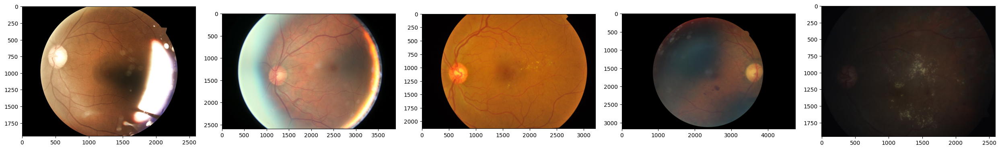

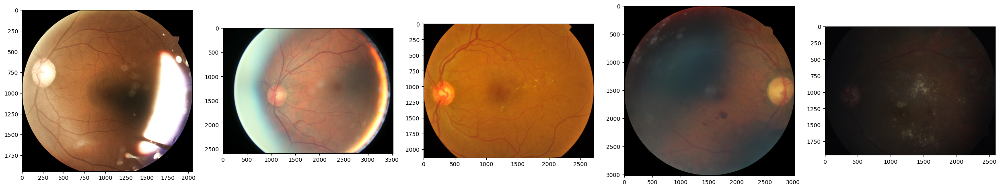

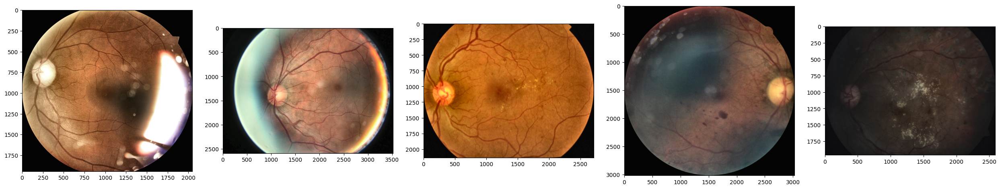

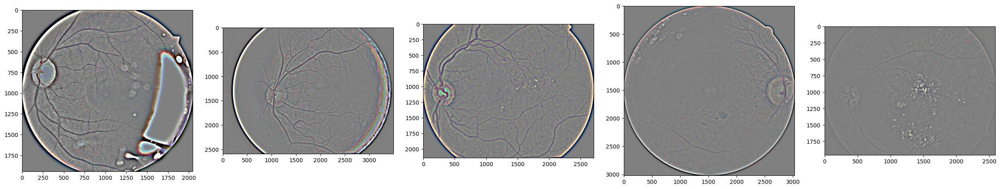

In [ ]:
import matplotlib.pyplot as plt


def display_samples(df, columns=5, rows=1, Process='Ben'):
    fig=plt.figure(figsize=(5*columns, 5*rows))

    for i in range(columns*rows):
        image_path = df.loc[i,'id_code']
#         image_id = df.loc[i,'diagnosis']
        path = f'/content/drive/MyDrive/DL/new_in/images/{image_path}.png'
        img = cv2.imread(path)
        if Process == 'Crop':
            img = p.crop_image_from_gray(img)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        elif Process == 'CLAHE':
            img = p.apply_clahe(img)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        elif Process == 'BEN20':
            img = p.load_ben20 (img)
        else:
            img = cv2.imread(path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        fig.add_subplot(rows, columns, i+1)
#         plt.title(image_id)
        plt.imshow(img)

    plt.tight_layout()

display_samples(train_df, Process='None')
display_samples(train_df, Process='Crop')
display_samples(train_df, Process='CLAHE')
display_samples(train_df, Process='BEN20')

In [ ]:
import pandas as pd
train_df= pd.read_csv('/content/drive/MyDrive/DL/sample_in/sample.csv')
print(train_df.shape)
train_df.head()

(5, 2)


,id_code,diagnosis
0,L0_4ad8d3ec8789,0
1,L1_0d310aba6373,1
2,L2_0c76fd494af6,2
3,L3_2b48daf24be0,3
4,L4_ebe0175e530c,4


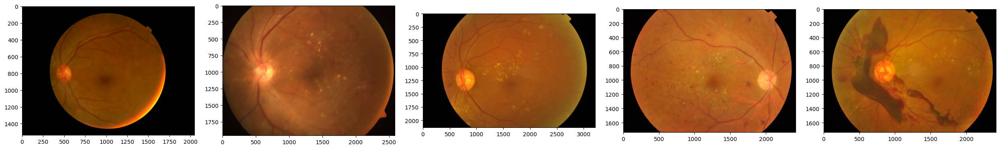

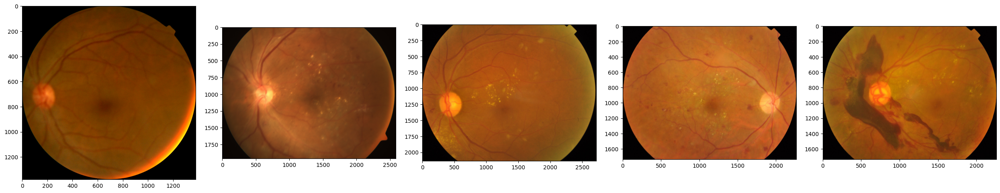

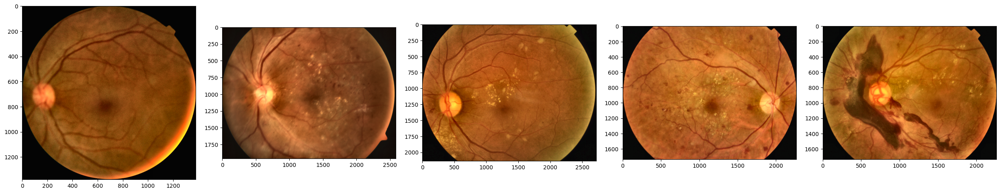

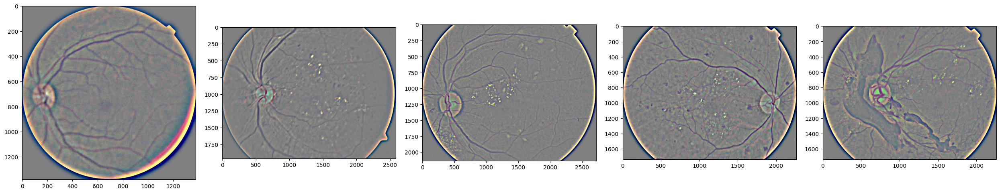

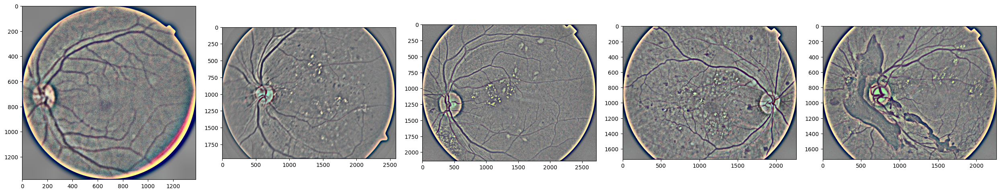

In [ ]:
import matplotlib.pyplot as plt


def display_samples(df, columns=5, rows=1, Process='Ben'):
    fig=plt.figure(figsize=(5*columns, 5*rows))

    for i in range(columns*rows):
        image_path = df.loc[i,'id_code']
#         image_id = df.loc[i,'diagnosis']
        path = f'/content/drive/MyDrive/DL/sample_in/{image_path}.png'
        img = cv2.imread(path)
        if Process == 'Crop':
            img = p.crop_image_from_gray(img)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        elif Process == 'CLAHE':
            img = p.apply_clahe(img)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        elif Process == 'BEN20':
            img = p.load_ben20 (img)
        elif Process == 'BEN20_CLAHE':
            img = p.load_ben20 (img)
            img = p.apply_clahe(img)
        else:
            img = cv2.imread(path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        fig.add_subplot(rows, columns, i+1)
#         plt.title(image_id)
        plt.imshow(img)

    plt.tight_layout()

display_samples(train_df, Process='None')
display_samples(train_df, Process='Crop')
display_samples(train_df, Process='CLAHE')
display_samples(train_df, Process='BEN20')
display_samples(train_df, Process='BEN20_CLAHE')